In [113]:
#Chargement des bibliothèques et modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from yellowbrick.cluster.elbow import kelbow_visualizer

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importation du dataset
data = pd.read_csv("segmentation.csv", sep="\t")

In [3]:
#Copie du dataset
df =  data.copy()

In [4]:
#Pour afficher toutes les colonnes
pd.set_option('display.max_columns', None)
#Affichage des 5 premières lignes du dataframe
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [5]:
#Taille du dataset
df.shape

(2240, 29)

In [6]:
#Informations générales du dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
#Pourcentage des valeurs manquantes par variable
(df.isna().sum()/df.shape[0])*100

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

Il y a **1,0714%** de valeurs manquantes. Ces valeurs manquantes sont dans la colonne de la variable **"Income"**.

In [8]:
#Valeurs des modalités par variable
for col in df:
    print((df[col].value_counts()))
    print('='*50)

5524    1
6885    1
3478    1
7494    1
1763    1
       ..
5682    1
5564    1
6516    1
6255    1
9405    1
Name: ID, Length: 2240, dtype: int64
1976    89
1971    87
1975    83
1972    79
1978    77
1970    77
1973    74
1965    74
1969    71
1974    69
1956    55
1958    53
1979    53
1952    52
1977    52
1968    51
1959    51
1966    50
1954    50
1955    49
1960    49
1982    45
1963    45
1967    44
1962    44
1957    43
1951    43
1983    42
1986    42
1964    42
1980    39
1981    39
1984    38
1961    36
1953    35
1985    32
1989    30
1949    30
1950    29
1988    29
1987    27
1948    21
1990    18
1946    16
1947    16
1991    15
1992    13
1945     8
1943     7
1944     7
1993     5
1995     5
1994     3
1996     2
1899     1
1941     1
1893     1
1900     1
1940     1
Name: Year_Birth, dtype: int64
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64
Married     864
Together    580
Single      480


La variable **ID** ne nous servira pas dans la suite de notre analyse. Il conviendra donc de la retirer de notre jeu de données

In [9]:
#Suppression de la variable ID
df = df.drop('ID', axis=1)
df.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [10]:
#Liste des noms des colonnes des variables quantitatives et qualitatives du dataset
var_quanti = ['Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth']
var_quali = ['Kidhome','Teenhome','Education','Marital_Status','AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Complain','Response']
print(f"Variables quantitatives: {len(var_quanti)}\nVariables qualitatives: {len(var_quali)}")

Variables quantitatives: 13
Variables qualitatives: 11


## I) ANALYSE EXPLORATOIRE

### I.1) Différentes réprésentations(graphiques) de chaque variable

#### I.1.1) Représentations graphiques des variables quantitatives

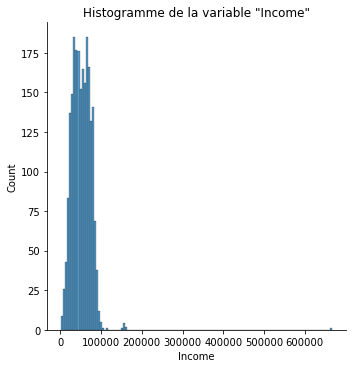

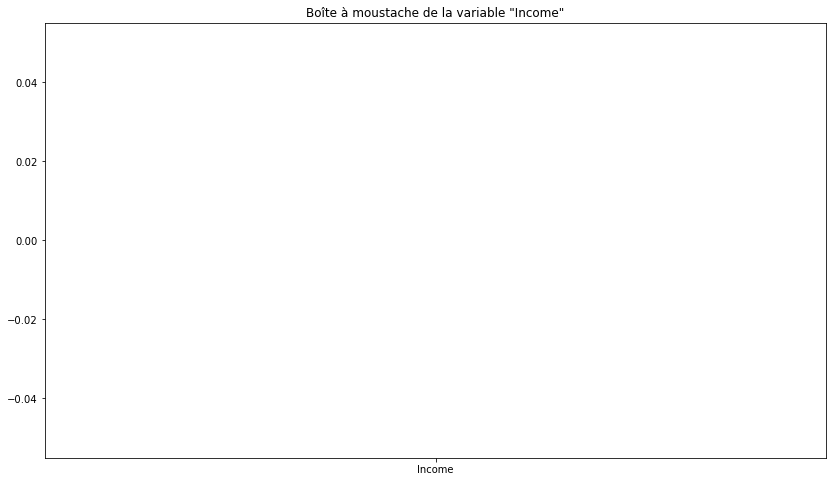

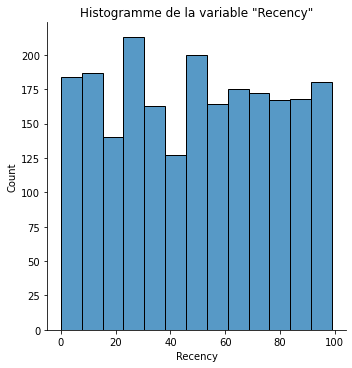

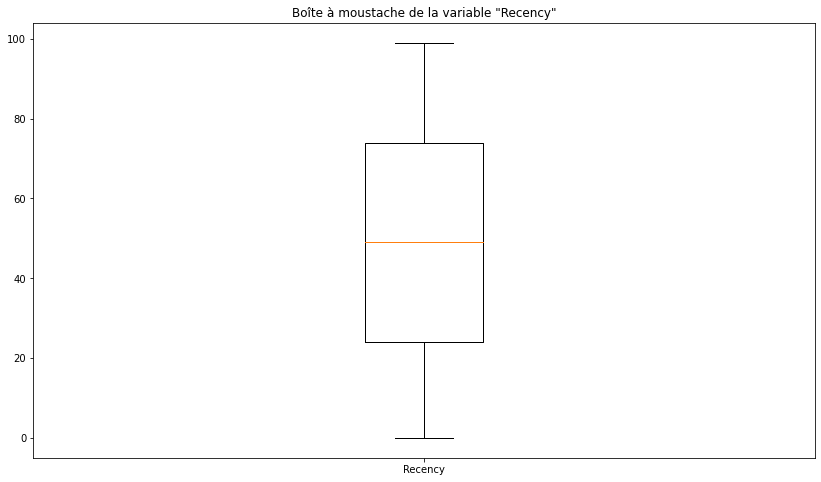

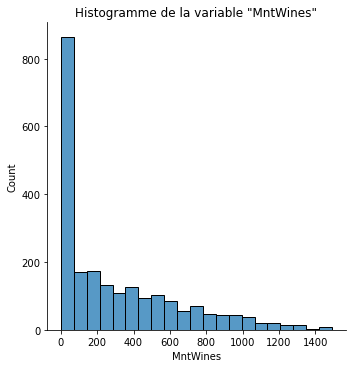

...

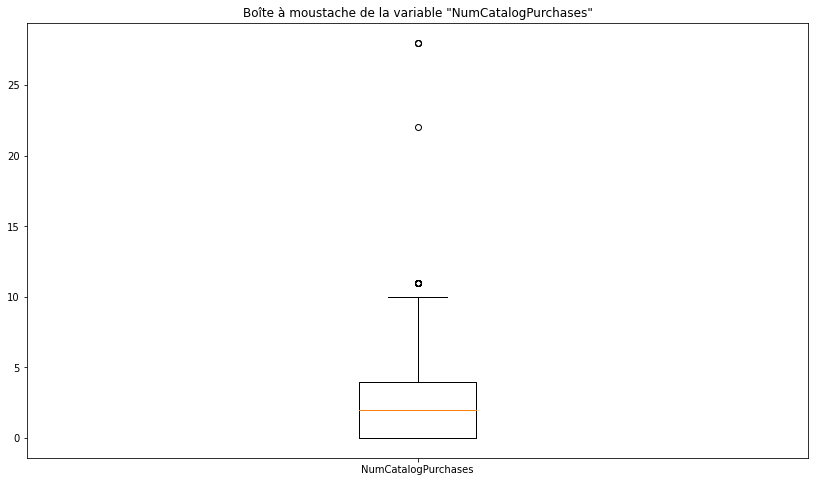

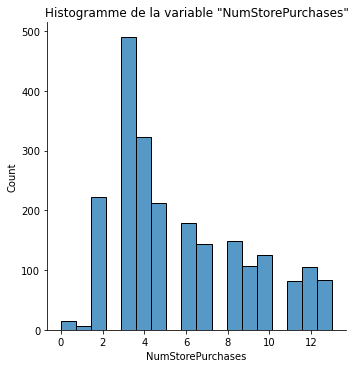

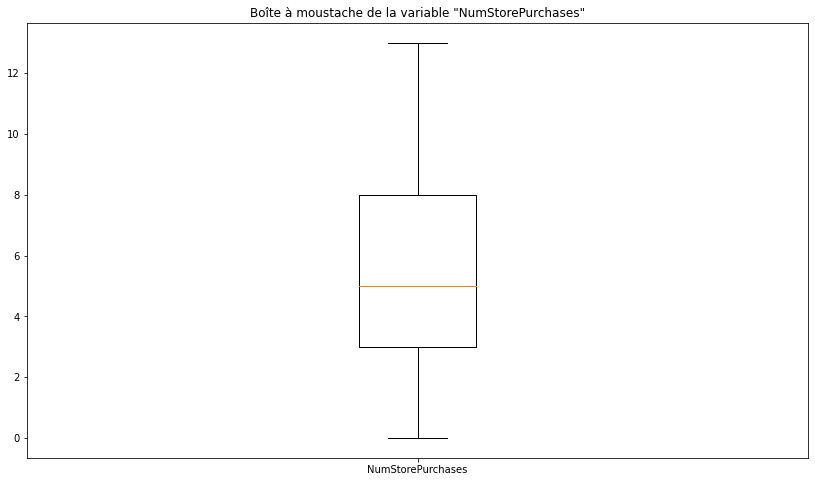

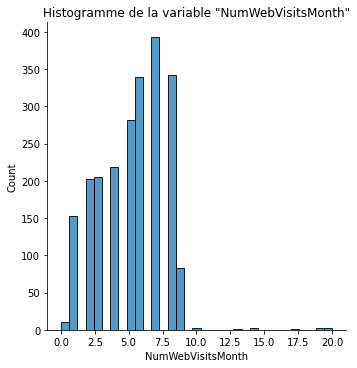

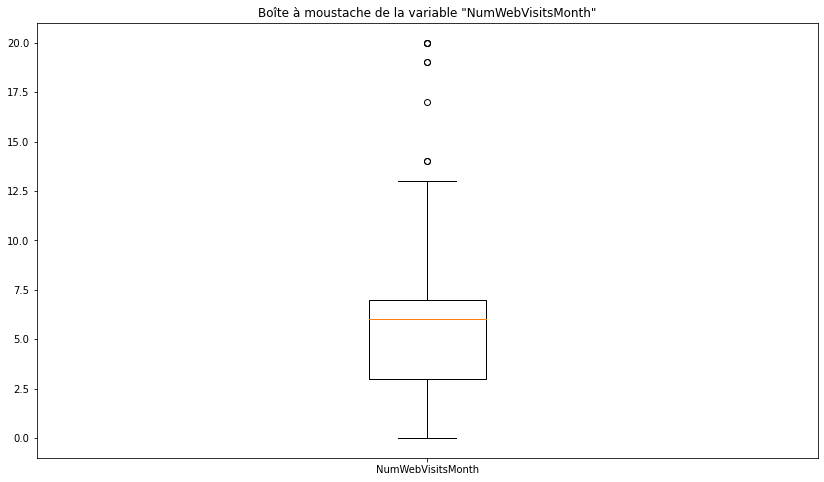

In [12]:
for col in var_quanti:
    print("=="*50)
    
    #Tracé de l'histogramme d'une variable
    sns.displot(df[col])
    plt.title(f'Histogramme de la variable "{col}"')
    plt.show()
    
    #Tracé de boîte à moustache d'une variable
    plt.figure(figsize=(14,8))
    plt.boxplot(df[col])
    plt.title(f'Boîte à moustache de la variable "{col}"')
    plt.gca().xaxis.set_ticklabels([f'{col}'])
    plt.show()

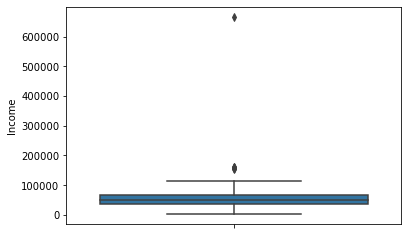

In [13]:
#Boîte à moustache de la variable "Income"
sns.boxplot(y="Income",data=df)
plt.show()

#### I.1.2) Représentations graphiques des variables qualitatives

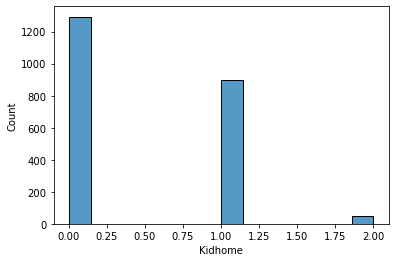

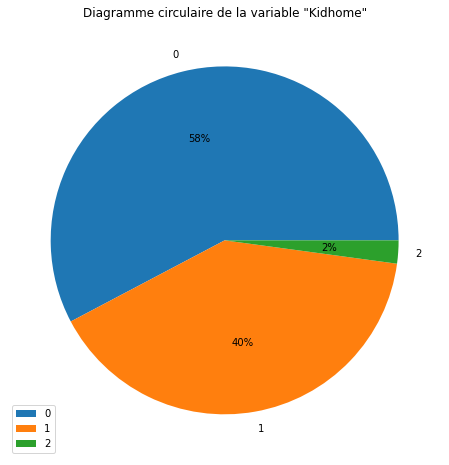

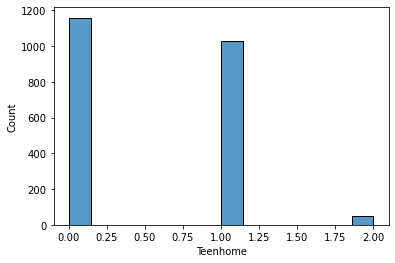

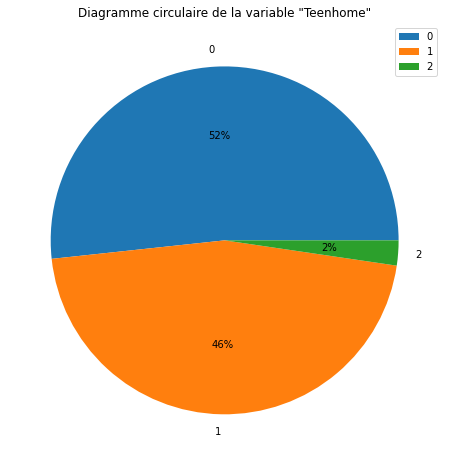

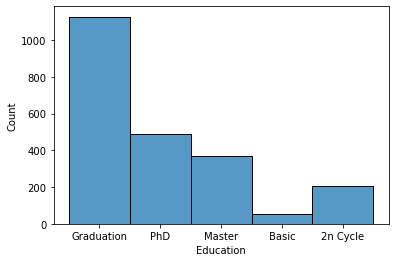

...

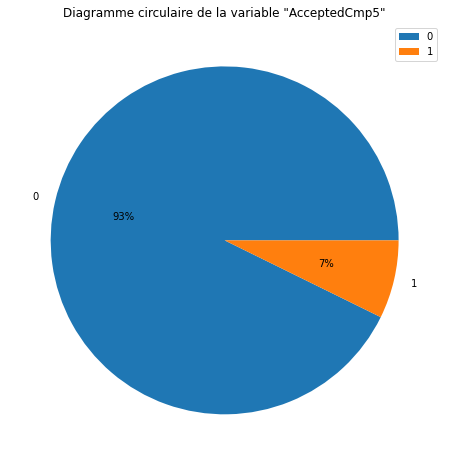

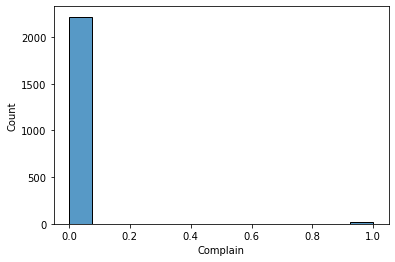

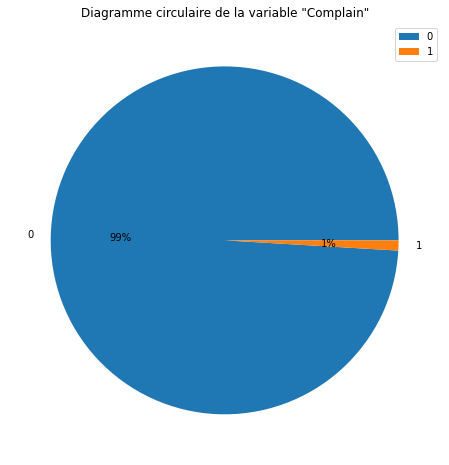

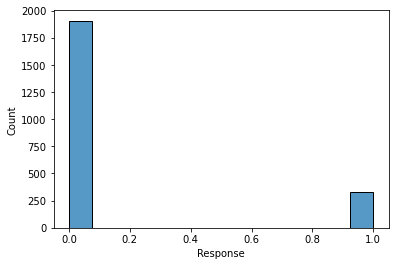

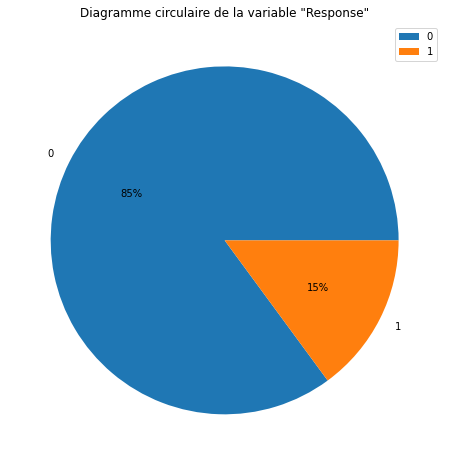

In [14]:
for col in var_quali:
    
    sns.histplot(data = df[col])
    plt.show()
    
    counts = df[col].value_counts()
    modalities = counts.index
    plt.figure(figsize = (14,8))
    plt.pie(counts, labels = modalities, autopct='%1.0f%%')
    plt.title(f'Diagramme circulaire de la variable "{col}"')
    plt.legend()
    plt.show()  

### I.2) Différentes réprésentations(graphiques) par groupe de deux(2) variables

#### I.2.1) Groupe de variables quantitative-quantitative (quanti-quanti)¶

In [18]:
#Création de datasframe des variables quantitatives
df_quanti = pd.DataFrame(df, columns = var_quanti)

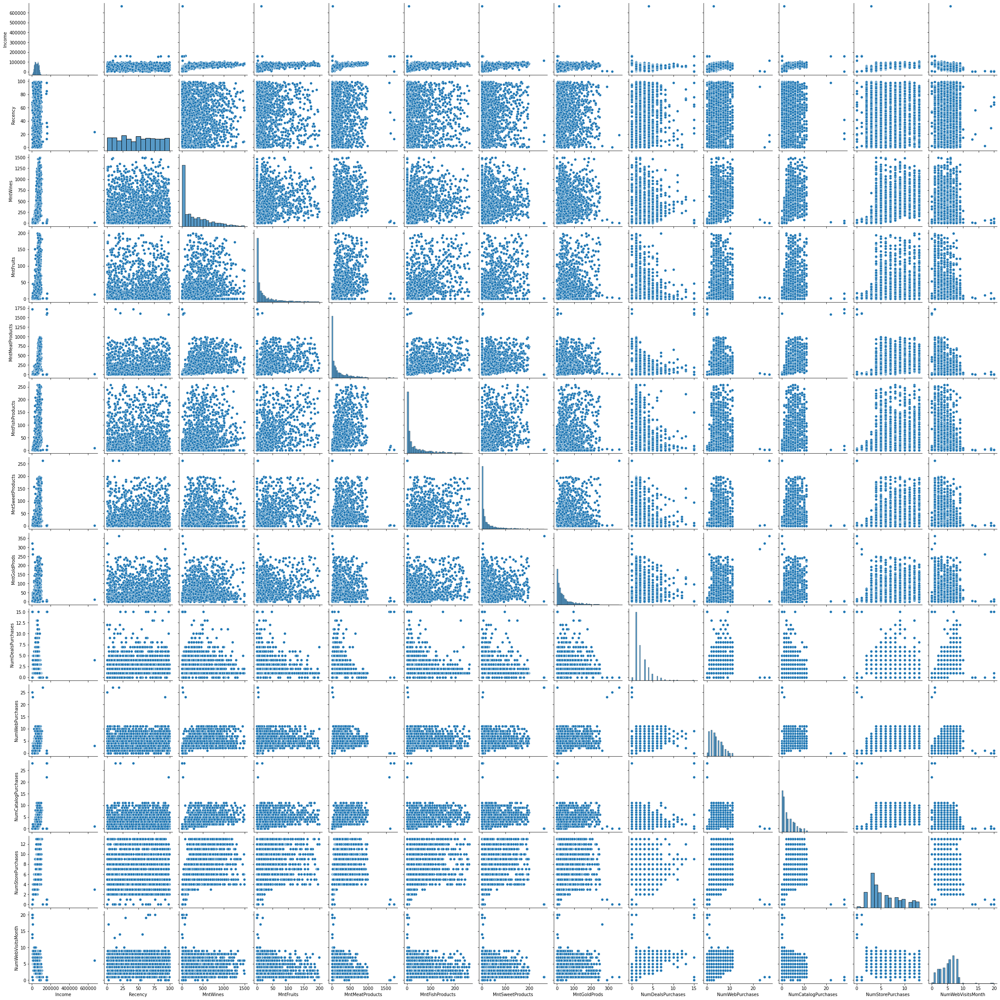

In [23]:
#Nuage de points des variables quantitatives deux à deux
sns.pairplot(df_quanti)

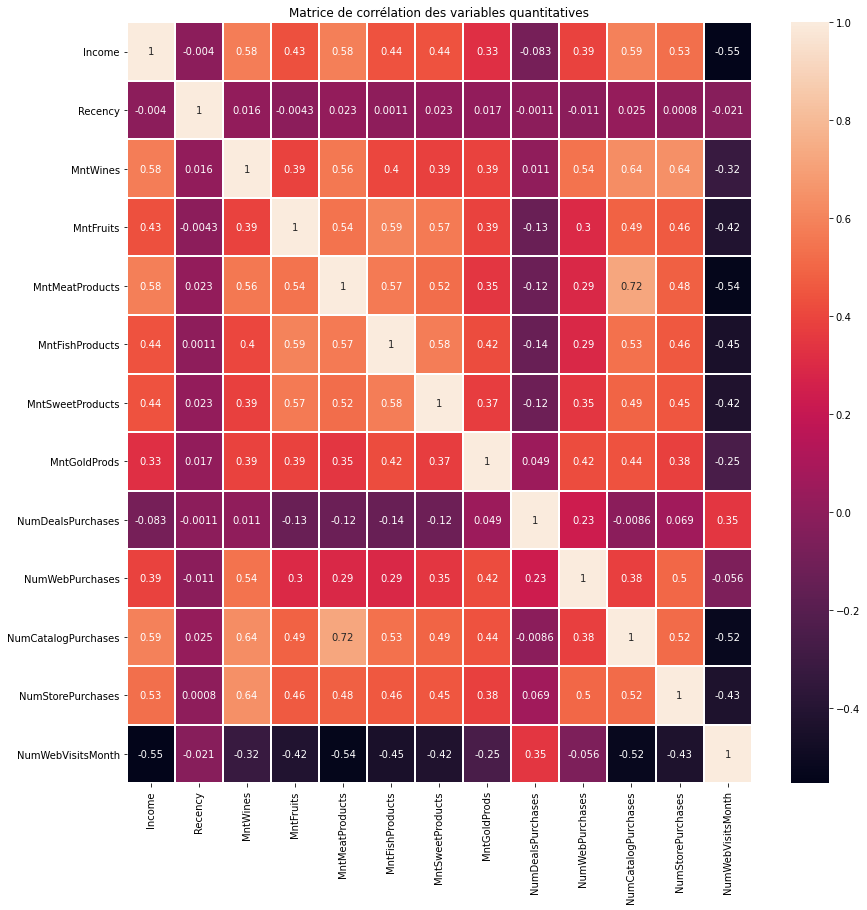

In [22]:
#Matrice de corrélation des variables quantitatives du dataset
plt.figure(figsize=(14,14))
sns.heatmap(df_quanti.corr(), linewidth = 1 , annot = True)
plt.title("Matrice de corrélation des variables quantitatives")
plt.show()

#### I.2.2) Groupe de variables quantitative-qualitative (quanti-quali)

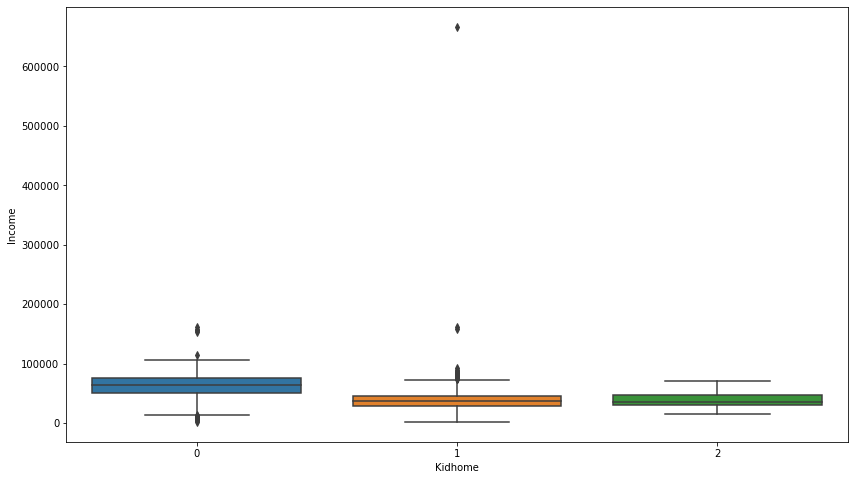

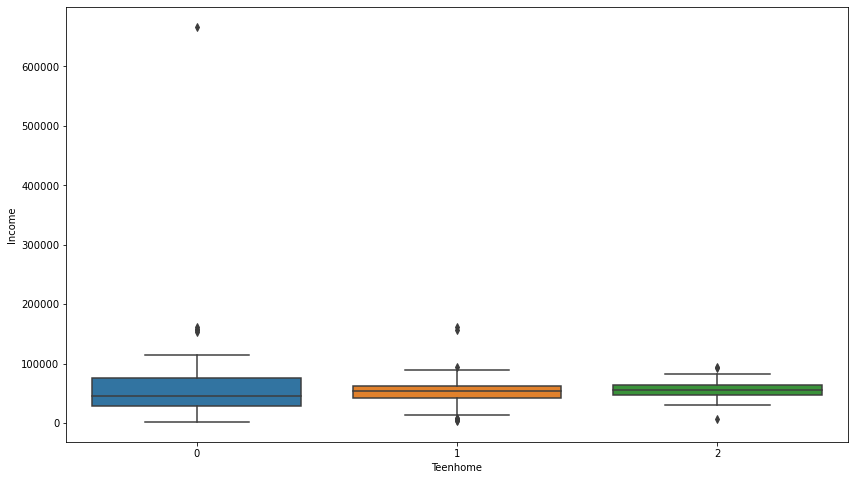

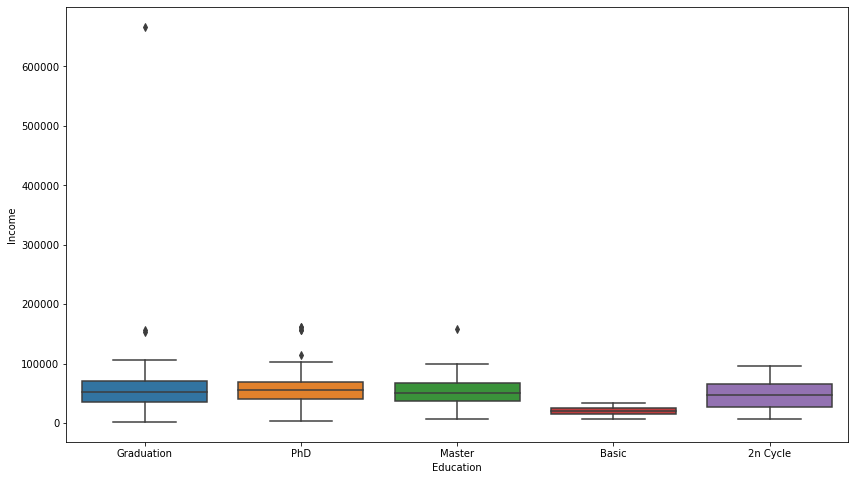

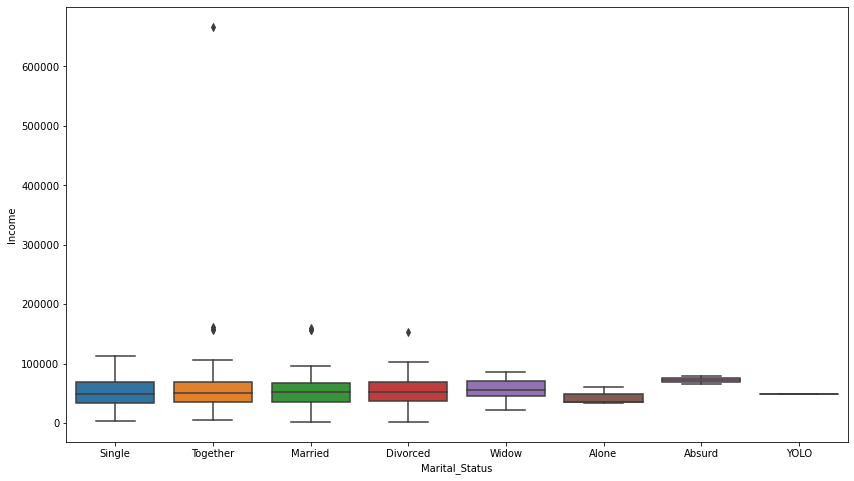

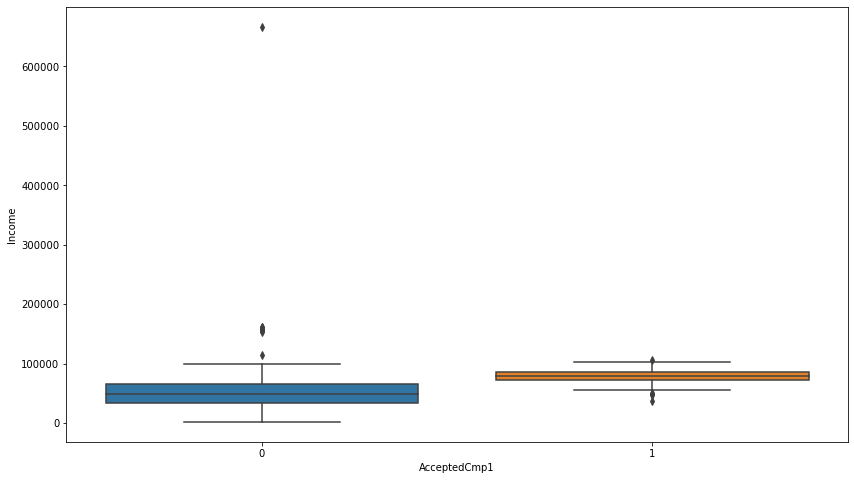

...

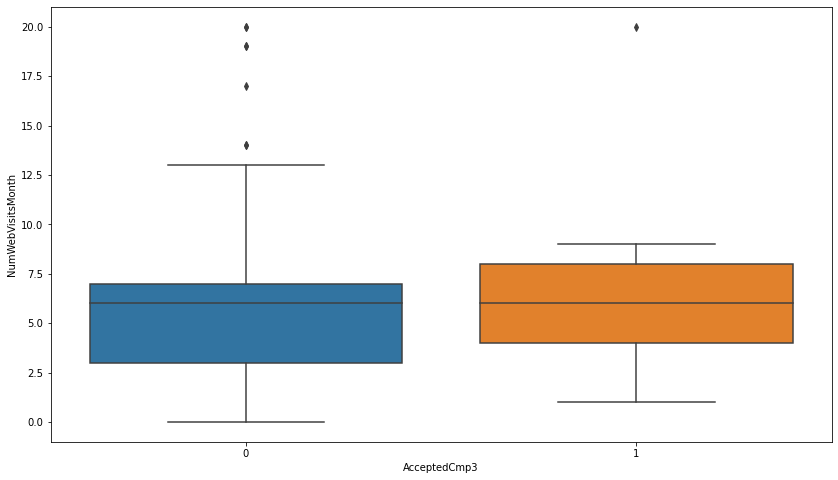

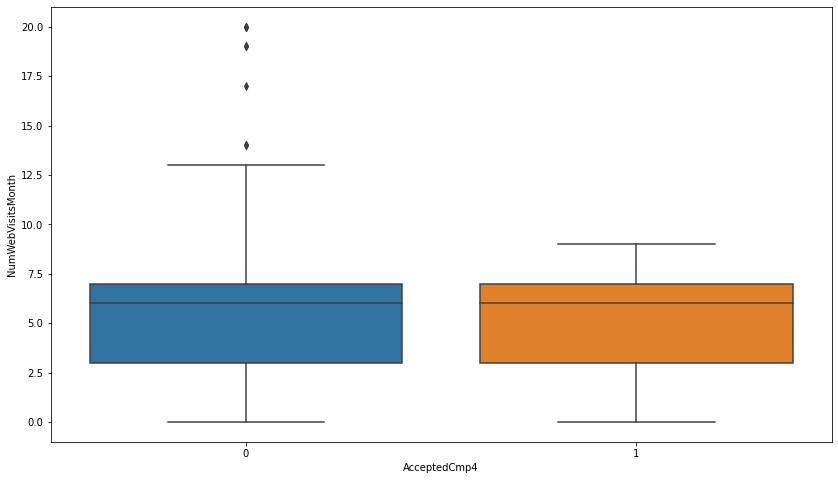

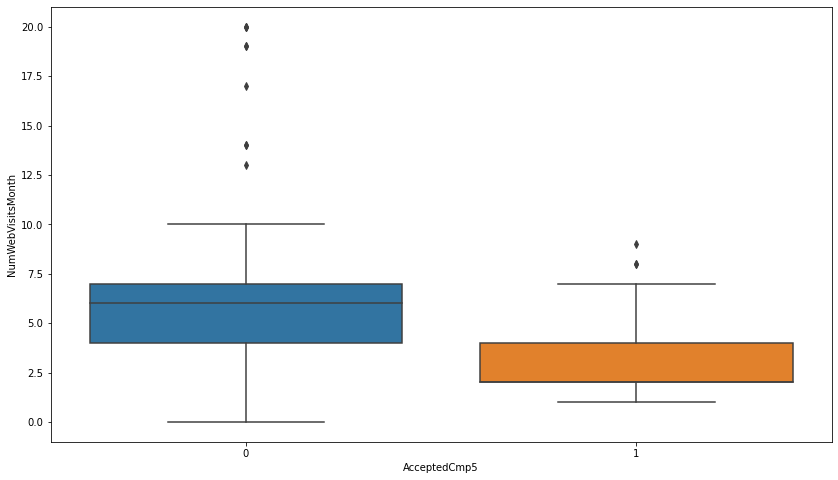

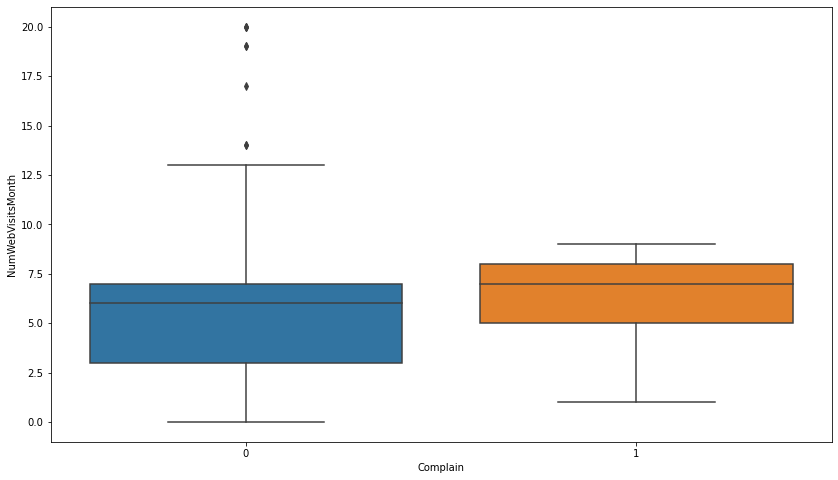

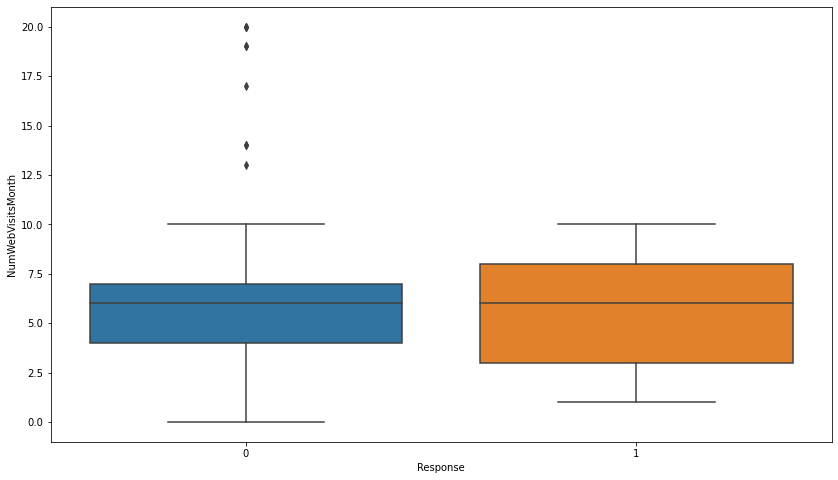

In [25]:
#Boîte à moustache croisée de variables qualitative et quantitative
for j in var_quanti:
    for i in var_quali:
        print("=="*50)
        plt.figure(figsize=(14,8))
        sns.boxplot(y=j, x=i, data=df)
        plt.show()

#### I.2.3) Groupe de variables qualitative-qualitative (quali-quali)

## II) PREPROCESSING

#### II.1) Supression des valeurs manquantes

Il s'agit ici d'une suppression des valeurs manquantes dans le dataset par les lignes

In [41]:
df = df.dropna(axis=0)
df.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [42]:
#On transforme les colonnes contenant des dates en datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

Vérifions s'il n'y a plus de données manquantes

In [43]:
df.isna().sum()

Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

Effectivement, il n'y a plus de données manquantes

#### II.2) Encodage du dataset

On remplacera les modalités des variables qualitatives du dataset par des chiffres adéquats.

In [44]:
def encodage(dataframe):
    code = {
        'Single':0, 'Married':1, 'Divorced':2, 'Together':3, 'Widow':4, 'Alone':5, 'Absurd':6, 'YOLO':7,  
        'Basic':0, '2n Cycle':1, 'Graduation':2, 'Master':3, 'PhD':4
    }
    for col in dataframe.select_dtypes('object').columns:
        dataframe.loc[:,col] = dataframe[col].map(code)
    
    return dataframe

In [46]:
df_enc = encodage(df)
df_enc.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,2,0,58138.0,0,0,2012-04-09,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,2,0,46344.0,1,1,2014-08-03,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,2,3,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,2,3,26646.0,1,0,2014-10-02,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,4,1,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


Le dataset a été bien encodé.

#### II.3) Normalisation du dataset

In [59]:
scaler = StandardScaler()

In [64]:
df_final = df_enc.copy()
for col in var_quanti:
    df_final[col] = scaler.fit_transform(df_final[[col]])

df_final.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,2,0,0.234063,0,0,2012-04-09,0.310532,0.978226,1.549429,1.690227,2.454568,1.484827,0.850031,0.351713,1.428553,2.504712,-0.554143,0.693232,0,0,0,0,0,0,3,11,1
1,1954,2,0,-0.234559,1,1,2014-08-03,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,-0.732867,-0.168231,-1.125881,-0.571082,-1.169518,-0.131574,0,0,0,0,0,0,3,11,0
2,1965,2,3,0.769478,0,0,2013-08-21,-0.795134,0.358511,0.569159,-0.178368,1.340203,-0.146821,-0.037937,-0.688176,1.428553,-0.229327,1.291982,-0.543978,0,0,0,0,0,0,3,11,0
3,1984,2,3,-1.017239,1,0,2014-10-02,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.168231,-0.760962,-0.912837,-0.554143,0.280829,0,0,0,0,0,0,3,11,0
4,1981,4,1,0.240221,1,0,2014-01-19,1.554407,-0.391671,0.418348,-0.218505,0.152766,-0.000703,-0.559135,1.391603,0.333796,0.112428,0.061232,-0.131574,0,0,0,0,0,0,3,11,0


Le dataset est bien normalisé

## III) SEGMENTATION DES CLIENTS (Clustering)

La variable **"Dt_Customer"** ne nous servira pas lors de la segmentation des clients, il conviendra de l'enlever.

In [73]:
X = df_final.drop(['Dt_Customer'], axis=1)

On choisit arbitrairement un nombre de clusters pour tester notre modèle de KMeans.
On choisira deux(2) clusters pour débuter.

In [85]:
model = KMeans(n_clusters=2)
model.fit(X)
predictions = model.predict(X)
predictions

array([1, 1, 1, ..., 0, 1, 1])

In [86]:
np.unique(predictions, return_counts = True)

(array([0, 1]), array([1273,  943], dtype=int64))

On ajoute les différentes étiquettes dans notre dataframe pour mieux les visualiser par la suite.

In [87]:
X_seg = X.copy()
X_seg["Cluster"] = predictions
X_seg.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Cluster
0,1957,2,0,0.234063,0,0,0.310532,0.978226,1.549429,1.690227,2.454568,1.484827,0.850031,0.351713,1.428553,2.504712,-0.554143,0.693232,0,0,0,0,0,0,3,11,1,1
1,1954,2,0,-0.234559,1,1,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,-0.732867,-0.168231,-1.125881,-0.571082,-1.169518,-0.131574,0,0,0,0,0,0,3,11,0,1
2,1965,2,3,0.769478,0,0,-0.795134,0.358511,0.569159,-0.178368,1.340203,-0.146821,-0.037937,-0.688176,1.428553,-0.229327,1.291982,-0.543978,0,0,0,0,0,0,3,11,0,1
3,1984,2,3,-1.017239,1,0,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.168231,-0.760962,-0.912837,-0.554143,0.280829,0,0,0,0,0,0,3,11,0,0
4,1981,4,1,0.240221,1,0,1.554407,-0.391671,0.418348,-0.218505,0.152766,-0.000703,-0.559135,1.391603,0.333796,0.112428,0.061232,-0.131574,0,0,0,0,0,0,3,11,0,0


On visualise nos données à travers une matrice de nuage de points en mettant en évidence les clusters.

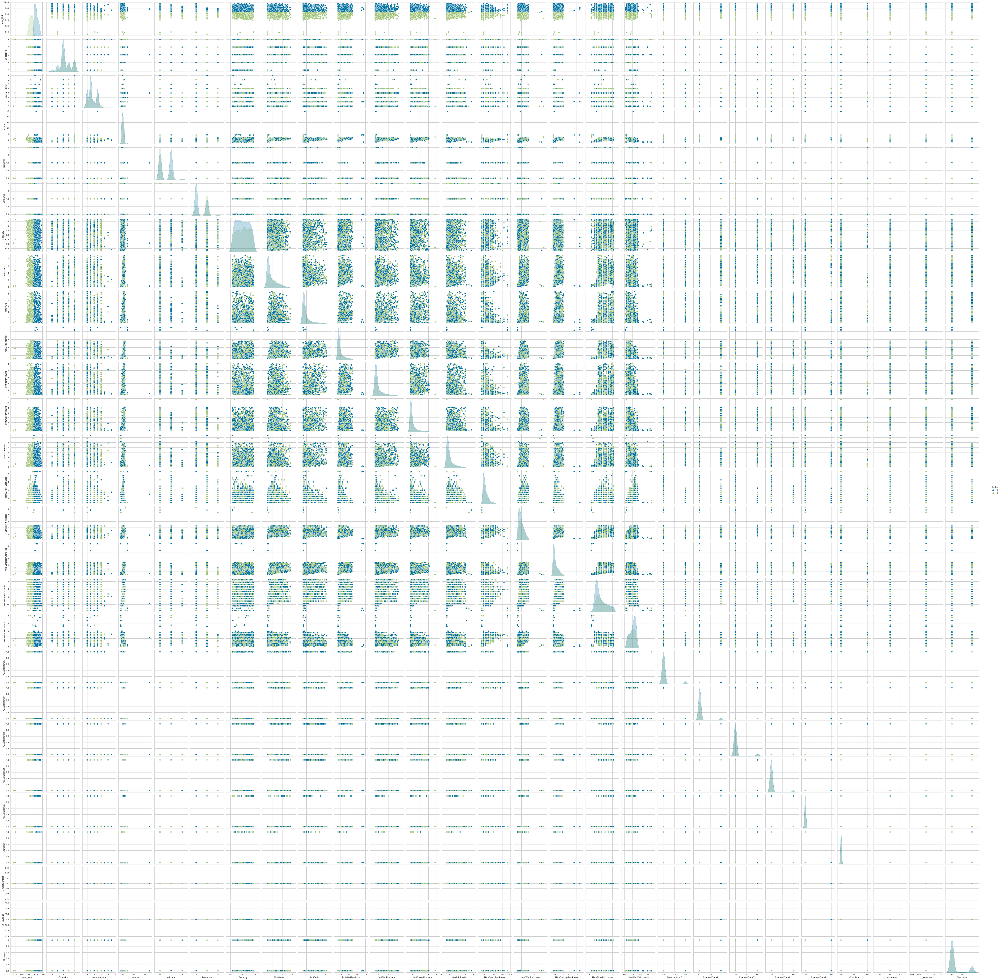

In [89]:
sns.pairplot(X_seg, hue="Cluster")

Pour utiliser le modèle de KMeans, il faut chercher le "bon" de nombre de clusters. 
<br>Pour le faire, on utilisera la **méthode de la zone de coude** (ou <em>"Elbow method"</em>) qui consiste à minimiser le coût de l'inertie.

In [91]:
#On crée une liste qui va recueillir les différentes inerties
inertia = []
#On définit une rangée de nombres de clusters (ici de 1 à 10)
K_range = range(1, 10)
#On boucle sur le modèle de KMeans pour alimenter notre liste d'inertie
for k in K_range:
    model = KMeans(n_clusters = k).fit(X)
    inertia.append(model.inertia_)

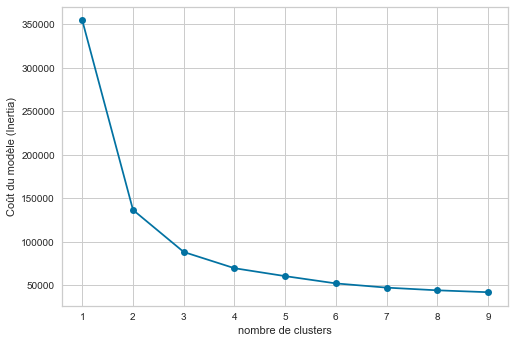

In [99]:
plt.plot(K_range, inertia, marker='o')
plt.xlabel('nombre de clusters')
plt.ylabel('Coût du modèle (Inertia)')
plt.show()

Le coude se forme bien au niveau de **k=3**.
<br>Le nombre de clusters est donc de 3.

Une autre manière de voir le nombre de clusters est d'utiliser la méthode de **KElbowVisualizer** contenue dans la bibliothèque **yellowbrick**.

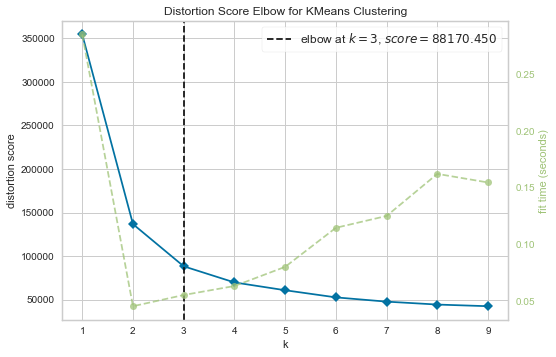

AttributeError: 'KMeans' object has no attribute 'k'

AttributeError: 'KMeans' object has no attribute 'k'

In [115]:
kelbow_visualizer(model, X, k=(1,10))

On reprend la même procédure en remplacant le nombre de clusters par 3

In [116]:
model = KMeans(n_clusters=3)
model.fit(X)
predictions = model.predict(X)
predictions

array([1, 1, 2, ..., 0, 1, 1])

In [118]:
np.unique(predictions, return_counts = True)

(array([0, 1, 2]), array([600, 690, 926], dtype=int64))

In [119]:
X_seg = X.copy()
X_seg["Cluster"] = predictions
X_seg.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Cluster
0,1957,2,0,0.234063,0,0,0.310532,0.978226,1.549429,1.690227,2.454568,1.484827,0.850031,0.351713,1.428553,2.504712,-0.554143,0.693232,0,0,0,0,0,0,3,11,1,1
1,1954,2,0,-0.234559,1,1,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,-0.732867,-0.168231,-1.125881,-0.571082,-1.169518,-0.131574,0,0,0,0,0,0,3,11,0,1
2,1965,2,3,0.769478,0,0,-0.795134,0.358511,0.569159,-0.178368,1.340203,-0.146821,-0.037937,-0.688176,1.428553,-0.229327,1.291982,-0.543978,0,0,0,0,0,0,3,11,0,2
3,1984,2,3,-1.017239,1,0,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.168231,-0.760962,-0.912837,-0.554143,0.280829,0,0,0,0,0,0,3,11,0,0
4,1981,4,1,0.240221,1,0,1.554407,-0.391671,0.418348,-0.218505,0.152766,-0.000703,-0.559135,1.391603,0.333796,0.112428,0.061232,-0.131574,0,0,0,0,0,0,3,11,0,0


In [120]:
#Afficher les centres des différents clusters
model.cluster_centers_

array([[ 1.98307167e+03,  2.14166667e+00,  1.27000000e+00,
        -1.70193597e-01,  5.83333333e-01,  1.45000000e-01,
        -2.39895785e-02, -1.98392635e-01,  1.64790946e-02,
         2.22866494e-02,  3.75774533e-03,  8.55078870e-03,
        -3.30784349e-02, -1.82962963e-01, -2.04460150e-01,
        -1.02878110e-01, -1.48508258e-01,  7.25651035e-02,
         9.83333333e-02,  5.33333333e-02,  9.33333333e-02,
         7.66666667e-02,  1.00000000e-02,  1.50000000e-02,
         3.00000000e+00,  1.10000000e+01,  1.68333333e-01],
       [ 1.95447536e+03,  2.61449275e+00,  1.76811594e+00,
         2.25284202e-01,  2.39130435e-01,  6.84057971e-01,
         1.32841017e-02,  2.28998430e-01,  5.28685862e-02,
         1.07592713e-01,  1.02859127e-01,  6.39908217e-02,
         1.03007977e-01,  5.83723794e-03,  1.67202134e-01,
         2.05048053e-01,  2.05711354e-01, -2.26008862e-01,
         5.50724638e-02,  9.85507246e-02,  7.97101449e-02,
         8.11594203e-02,  1.73913043e-02,  1.44927536e-

Calcul de l'inertie

In [121]:
model.inertia_

88170.45043625102

In [122]:
model.score(X)

-88170.45043625098

Visualisation des trois(3) différents clusters à travers une matrice de nuages de points

In [ ]:
sns.pairplot(X_seg, hue="Cluster")